In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Faster R-CNN

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

✨🍰✨ Everything looks OK!


In [ ]:
! conda install pytorch=1.1.0 torchvision -c pytorch -y

Channels:
 - pytorch
 - conda-forge
Platform: linux-64
Solving environment: / - \ | / failed

PackagesNotFoundError: The following packages are not available from current channels:

  - pytorch=1.1.0*

Current channels:

  - https://conda.anaconda.org/pytorch
  - https://conda.anaconda.org/conda-forge

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




In [ ]:
import torchvision
from torchvision import  transforms
import torch
from torch import no_grad

In [ ]:
import requests

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
# This function will assign a string name to a predicted class and eliminate predictions whose likelihood is under a threshold.
def get_predictions(pred, threshold=0.8, objects=None):
    """
    This function will assign a string name to a predicted class and eliminate predictions whose likelihood  is under a threshold

    pred: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class yhat, probability of belonging to that class and the coordinates of the bounding box corresponding to the object
    image : frozen surface
    predicted_classes: a list where each element contains a tuple that corresponds to information about  the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object
    thre
    """


    predicted_classes= [(COCO_INSTANCE_CATEGORY_NAMES[i],p,[(box[0], box[1]), (box[2], box[3])]) for i,p,box in zip(list(pred[0]['labels'].numpy()),pred[0]['scores'].detach().numpy(),list(pred[0]['boxes'].detach().numpy()))]
    predicted_classes=[  stuff  for stuff in predicted_classes  if stuff[1]>threshold ]

    if objects  and predicted_classes :
        predicted_classes=[ (name, p, box) for name, p, box in predicted_classes if name in  objects ]
    return predicted_classes

In [ ]:
# Draws box around each object
def draw_box(pred_class, img, rect_th=2, text_size=0.5, text_th=2, download_image=False, img_name="img"):
    """
    draws box around each object

    predicted_classes: a list where each element contains a tuple that corresponds to information about the different objects; Each element includes a tuple with the class name, probability of belonging to that class and the coordinates of the bounding box corresponding to the object
    image : frozen surface

    """
    image = (np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8).copy()

    for predicted_class in pred_class:

      label=predicted_class[0]
      probability=predicted_class[1]
      box=predicted_class[2]
      t = round(box[0][0].tolist())
      l = round(box[0][1].tolist())
      r = round(box[1][0].tolist())
      b = round(box[1][1].tolist())

      # Giving brief information about rectange, class and probability.
      from colorama import Fore
      from colorama import Style
      print(f"\nLabel: {Fore.GREEN}{label}{Style.RESET_ALL}")
      print(f"Box coordinates: {t}, {l}, {r}, {b}")
      print(f"Probability: {probability}")

      # Drawing rectangle and adding text on the picture based on their class and size.
      cv2.rectangle(image, (t, l), (r, b), (0, 255, 0), rect_th)
      cv2.rectangle(image, (t, l), (t+110, l+17), (255, 255, 255), -1)
      cv2.putText(image, label, (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX,
                  text_size, (0,255,0), thickness=text_th)
      cv2.putText(image, label+": "+str(round(probability, 2)),
                  (t+10, l+12),  cv2.FONT_HERSHEY_SIMPLEX, text_size,
                  (0, 255, 0),thickness=text_th)

    # Plotting image
    image = np.array(image)
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if download_image:
      plt.savefig(f'{img_name}.png')
    else:
      pass
    plt.show()

    del(img)
    del(image)

In [ ]:
 # This function will speed up the code by freeing memory:
def save_RAM(image_=False):
    global image, img, pred
    torch.cuda.empty_cache()
    del(img)
    del(pred)
    if image_:
        image.close()
        del(image)

In [ ]:
# Faster R-CNN is a model that predicts both bounding boxes and class scores for potential objects in the image pre-trained on COCO.
# load the pre-trained model Faster R-CNN
model_ = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_.eval()

for name, param in model_.named_parameters():
    param.requires_grad = False
print("done")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


done


In [ ]:
# the function calls Faster R-CNN  model_  but save RAM:
def model(x):
    with torch.no_grad():
        yhat = model_(x)
    return yhat

In [ ]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush',
]
len(COCO_INSTANCE_CATEGORY_NAMES)

91

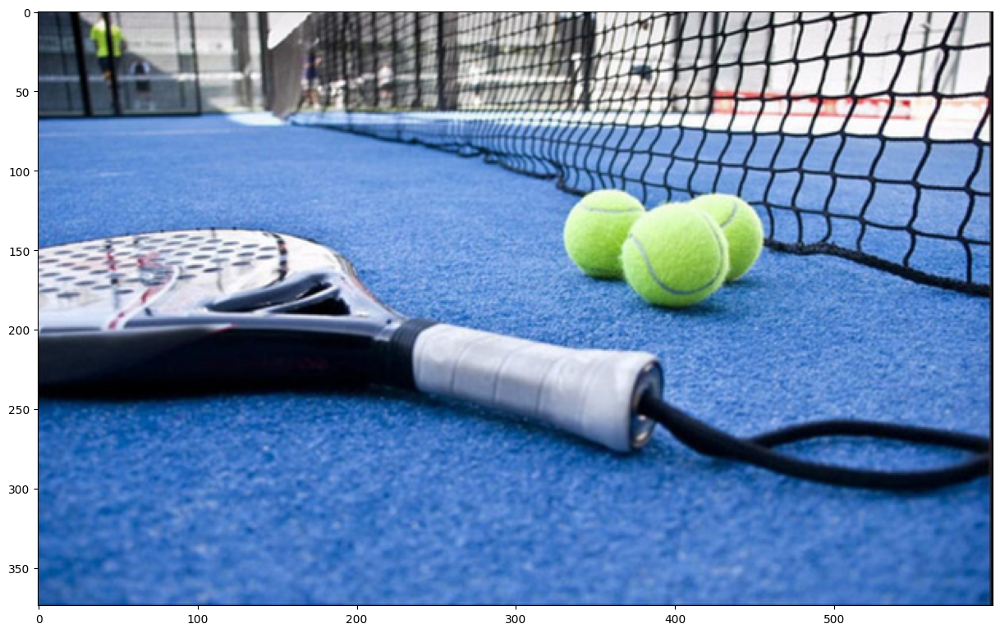

In [ ]:
# In Object Localization we locate the presence of objects in an image and indicate the location with a bounding box.
from PIL import Image
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.23.39_97763c78.jpg'
half = 0.5

image = Image.open(img_path)
resized_image = image.resize([int(half * s) for s in image.size])  # Resize the image and assign it to resized_image

plt.figure(figsize=(15, 10))
plt.imshow(resized_image)  # Display the resized image
plt.show()


In [ ]:
# We will create a transform object to convert the image to a tensor.
transform = transforms.Compose([transforms.ToTensor()])

In [ ]:
img = transform(image)

In [ ]:
# We can make a prediction,The output is a dictionary with several predicted classes,
# the probability of belonging to that class and the coordinates of the bounding box corresponding to that class.
pred = model([img])

In [ ]:
tennis_ball_label = COCO_INSTANCE_CATEGORY_NAMES.index('tennis ball')  # Get the index of 'sports ball' in COCO_INSTANCE_CATEGORY_NAMES

# Filter predictions for tennis balls only
tennis_ball_predictions = [{'boxes': box, 'labels': label, 'scores': score} for box, label, score in zip(pred[0]['boxes'], pred[0]['labels'], pred[0]['scores']) if label == tennis_ball_label]

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_predictions))

# Display tennis ball predictions (if needed)
print("Tennis ball predictions:", tennis_ball_predictions)


Number of tennis ball predictions: 0
Tennis ball predictions: []


In [ ]:
# Find the index corresponding to 'sports ball' (tennis ball)
tennis_ball_index = COCO_INSTANCE_CATEGORY_NAMES.index('sports ball')

# Initialize variables to store tennis ball predictions
tennis_ball_labels = []
tennis_ball_scores = []
tennis_ball_boxes = []

# Iterate through each prediction and filter out tennis ball predictions
for label, score, box in zip(pred[0]['labels'], pred[0]['scores'], pred[0]['boxes']):
    if label.item() == tennis_ball_index:  # Check if the label corresponds to tennis ball
        tennis_ball_labels.append(label.item())  # Add the label to the tennis ball labels list
        tennis_ball_scores.append(score.item())  # Add the score to the tennis ball scores list
        tennis_ball_boxes.append(box.tolist())  # Add the bounding box to the tennis ball boxes list

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_labels))

# Print tennis ball predictions (if needed)
print("Tennis ball labels:", tennis_ball_labels)
print("Tennis ball scores:", tennis_ball_scores)
print("Tennis ball boxes:", tennis_ball_boxes)

# information about the first tennis ball prediction:
if len(tennis_ball_labels) > 0:
    t, l, r, b = [round(x) for x in tennis_ball_boxes[0]]
    print("Bounding box coordinates for the first tennis ball prediction:", t, l, r, b)


Number of tennis ball predictions: 3
Tennis ball labels: [37, 37, 37]
Tennis ball scores: [0.9979748129844666, 0.992006242275238, 0.8971265554428101]
Tennis ball boxes: [[661.3494873046875, 225.81410217285156, 765.5989990234375, 340.6006164550781], [729.490234375, 231.8740997314453, 900.8600463867188, 373.2862548828125], [813.4776000976562, 229.76031494140625, 911.0186157226562, 343.5425720214844]]
Bounding box coordinates for the first tennis ball prediction: 661 226 766 341


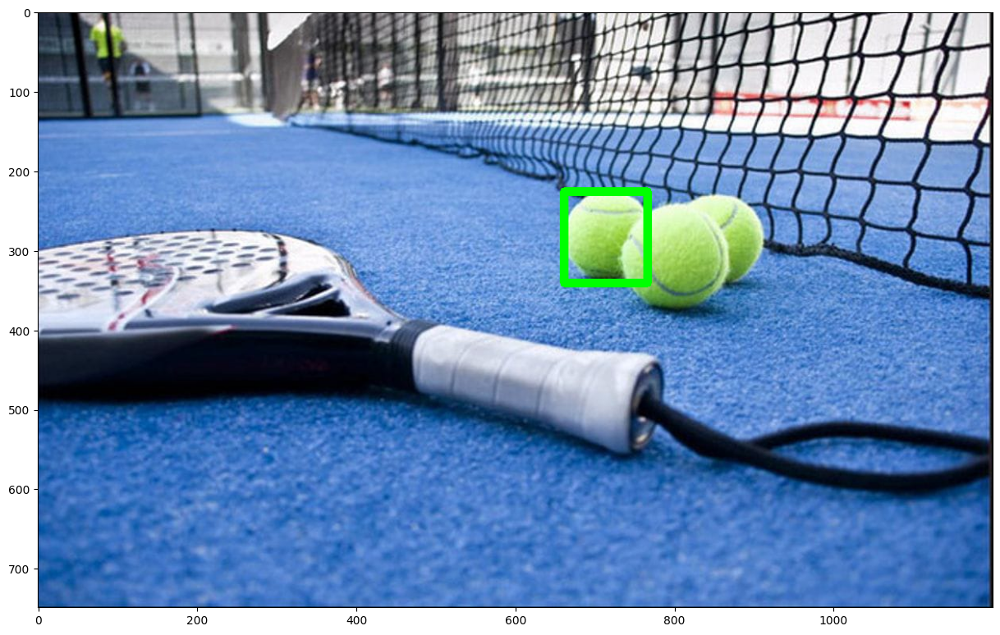

In [ ]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b

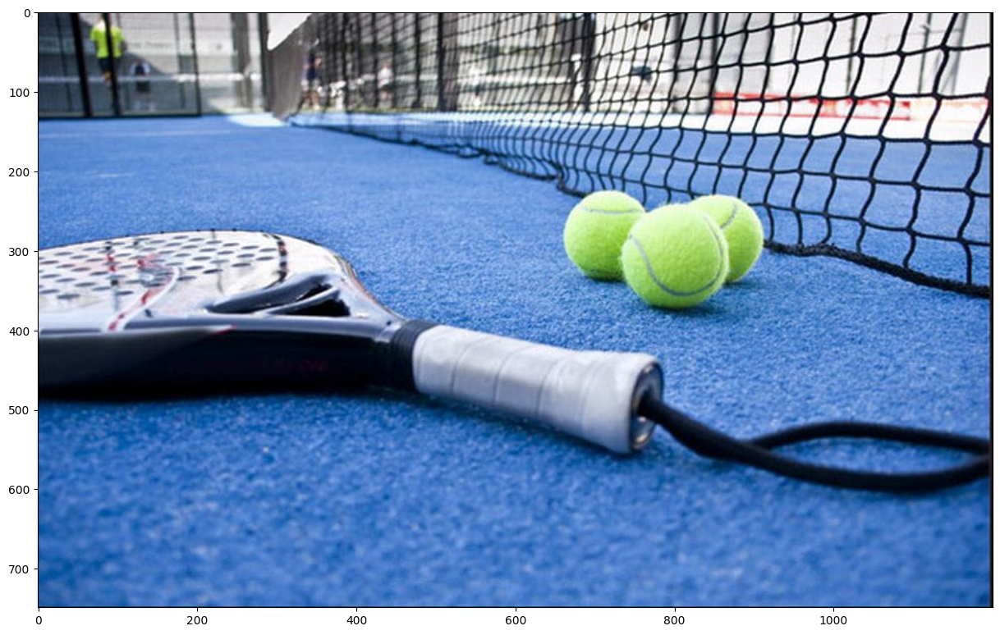

In [ ]:
img_path='/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.23.39_97763c78.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()


Label: sports ball
Box coordinates: 661, 226, 766, 341
Probability: 0.9979748129844666

Label: sports ball
Box coordinates: 729, 232, 901, 373
Probability: 0.992006242275238

Label: sports ball
Box coordinates: 813, 230, 911, 344
Probability: 0.8971265554428101


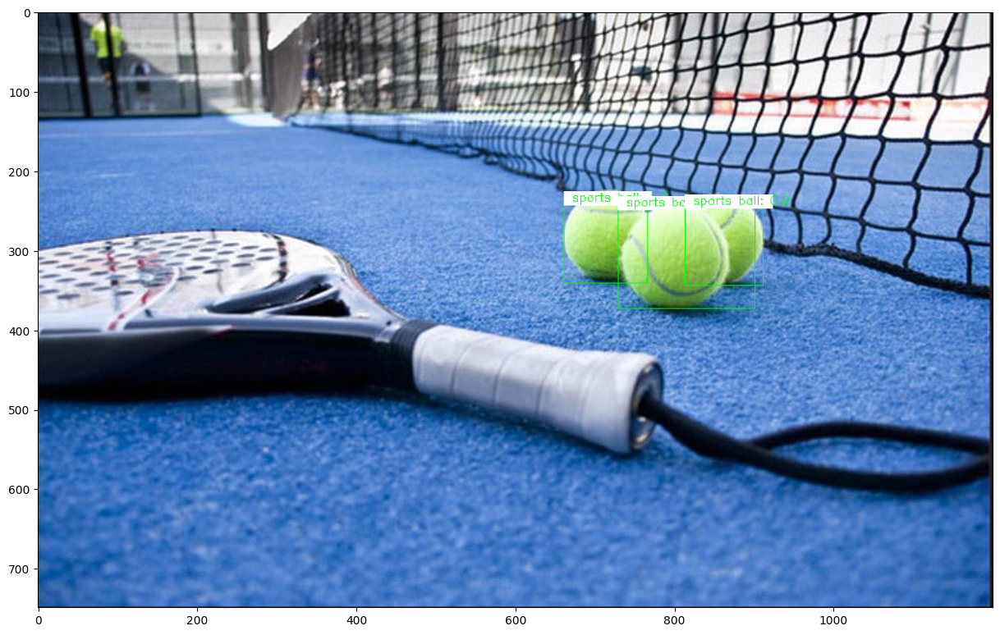

In [ ]:
pred_obj=get_predictions(pred,objects="tennis ball")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="52_jpg.rf.ef899df25692cda31b564e263380f9d5")

del pred_obj

## ANOTHER EXPL

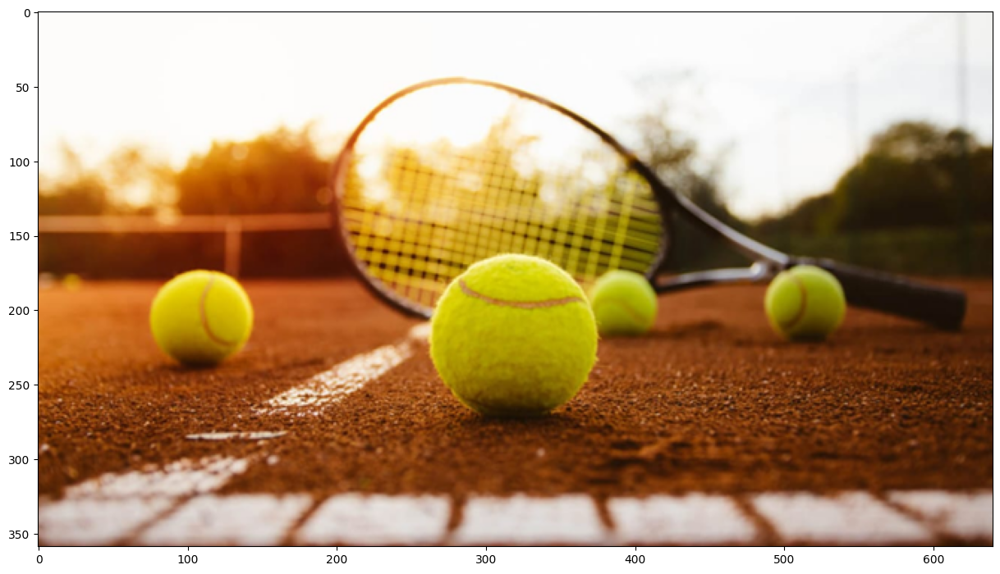

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.13.25_15aefd67.jpg'
half = 0.5

image = Image.open(img_path)
resized_image = image.resize([int(half * s) for s in image.size])  # Resize the image and assign it to resized_image

plt.figure(figsize=(15, 10))
plt.imshow(resized_image)  # Display the resized image
plt.show()


In [ ]:
transform = transforms.Compose([transforms.ToTensor()])
img = transform(image)
img

tensor([[[0.9922, 0.9922, 0.9922,  ..., 0.9490, 0.9490, 0.9490],
         [0.9922, 0.9922, 0.9922,  ..., 0.9490, 0.9490, 0.9490],
         [0.9922, 0.9922, 0.9922,  ..., 0.9490, 0.9490, 0.9490],
         ...,
         [0.4431, 0.4431, 0.4471,  ..., 0.3216, 0.3333, 0.3373],
         [0.4157, 0.4157, 0.4157,  ..., 0.3137, 0.3216, 0.3294],
         [0.3922, 0.3922, 0.3922,  ..., 0.3020, 0.3137, 0.3176]],

        [[0.9882, 0.9882, 0.9882,  ..., 0.9490, 0.9490, 0.9490],
         [0.9882, 0.9882, 0.9882,  ..., 0.9490, 0.9490, 0.9490],
         [0.9882, 0.9882, 0.9882,  ..., 0.9490, 0.9490, 0.9490],
         ...,
         [0.2431, 0.2431, 0.2471,  ..., 0.1608, 0.1765, 0.1804],
         [0.2157, 0.2157, 0.2157,  ..., 0.1529, 0.1647, 0.1725],
         [0.1922, 0.1922, 0.1922,  ..., 0.1529, 0.1686, 0.1725]],

        [[0.9804, 0.9804, 0.9804,  ..., 0.9412, 0.9412, 0.9412],
         [0.9804, 0.9804, 0.9804,  ..., 0.9412, 0.9412, 0.9412],
         [0.9804, 0.9804, 0.9804,  ..., 0.9412, 0.9412, 0.

In [ ]:
pred = model([img])

In [ ]:
# Assuming pred is your model's prediction output
tennis_ball_label = COCO_INSTANCE_CATEGORY_NAMES.index('sports ball')  # Get the index of 'sports ball' in COCO_INSTANCE_CATEGORY_NAMES

# Filter predictions for tennis balls only
tennis_ball_predictions = [{'boxes': box, 'labels': label, 'scores': score} for box, label, score in zip(pred[0]['boxes'], pred[0]['labels'], pred[0]['scores']) if label == tennis_ball_label]

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_predictions))

# Display tennis ball predictions (if needed)
print("Tennis ball predictions:", tennis_ball_predictions)


Number of tennis ball predictions: 9
Tennis ball predictions: [{'boxes': tensor([150.7163, 348.6085, 289.0726, 479.1500]), 'labels': tensor(37), 'scores': tensor(0.9995)}, {'boxes': tensor([525.2762, 326.1784, 751.6359, 552.1838]), 'labels': tensor(37), 'scores': tensor(0.9991)}, {'boxes': tensor([738.5536, 350.8748, 831.7192, 439.2487]), 'labels': tensor(37), 'scores': tensor(0.9989)}, {'boxes': tensor([ 975.3262,  343.0489, 1083.6042,  444.6268]), 'labels': tensor(37), 'scores': tensor(0.9971)}, {'boxes': tensor([401.7480, 120.9582, 882.8573, 422.0404]), 'labels': tensor(37), 'scores': tensor(0.6496)}, {'boxes': tensor([ 974.5039,  352.1186, 1037.3362,  440.6448]), 'labels': tensor(37), 'scores': tensor(0.1945)}, {'boxes': tensor([ 402.4525,  100.0333, 1119.1810,  522.9446]), 'labels': tensor(37), 'scores': tensor(0.1755)}, {'boxes': tensor([553.9620, 327.8395, 737.3071, 442.7782]), 'labels': tensor(37), 'scores': tensor(0.0661)}, {'boxes': tensor([504.1229, 242.8178, 843.0300, 537.6

In [ ]:


# Find the index corresponding to 'sports ball' (tennis ball)
tennis_ball_index = COCO_INSTANCE_CATEGORY_NAMES.index('sports ball')

# Initialize variables to store tennis ball predictions
tennis_ball_labels = []
tennis_ball_scores = []
tennis_ball_boxes = []

# Iterate through each prediction and filter out tennis ball predictions
for label, score, box in zip(pred[0]['labels'], pred[0]['scores'], pred[0]['boxes']):
    if label.item() == tennis_ball_index:  # Check if the label corresponds to tennis ball
        tennis_ball_labels.append(label.item())  # Add the label to the tennis ball labels list
        tennis_ball_scores.append(score.item())  # Add the score to the tennis ball scores list
        tennis_ball_boxes.append(box.tolist())  # Add the bounding box to the tennis ball boxes list

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_labels))

# Print tennis ball predictions (if needed)
print("Tennis ball labels:", tennis_ball_labels)
print("Tennis ball scores:", tennis_ball_scores)
print("Tennis ball boxes:", tennis_ball_boxes)

# If you want information about the first tennis ball prediction:
if len(tennis_ball_labels) > 0:
    t, l, r, b = [round(x) for x in tennis_ball_boxes[0]]
    print("Bounding box coordinates for the first tennis ball prediction:", t, l, r, b)


Number of tennis ball predictions: 9
Tennis ball labels: [37, 37, 37, 37, 37, 37, 37, 37, 37]
Tennis ball scores: [0.9995231628417969, 0.9991335272789001, 0.9989206790924072, 0.997104823589325, 0.6496056914329529, 0.19453203678131104, 0.17547158896923065, 0.0660785362124443, 0.06317389011383057]
Tennis ball boxes: [[150.71630859375, 348.6084899902344, 289.07257080078125, 479.1499938964844], [525.2762451171875, 326.1783752441406, 751.6359252929688, 552.183837890625], [738.5535888671875, 350.87481689453125, 831.7191772460938, 439.2486572265625], [975.3262329101562, 343.0488586425781, 1083.604248046875, 444.62677001953125], [401.748046875, 120.95820617675781, 882.8572998046875, 422.0404357910156], [974.50390625, 352.11859130859375, 1037.336181640625, 440.6448059082031], [402.4525146484375, 100.03334045410156, 1119.1810302734375, 522.9446411132812], [553.9620361328125, 327.8394775390625, 737.3070678710938, 442.7781982421875], [504.12286376953125, 242.81781005859375, 843.030029296875, 537.6

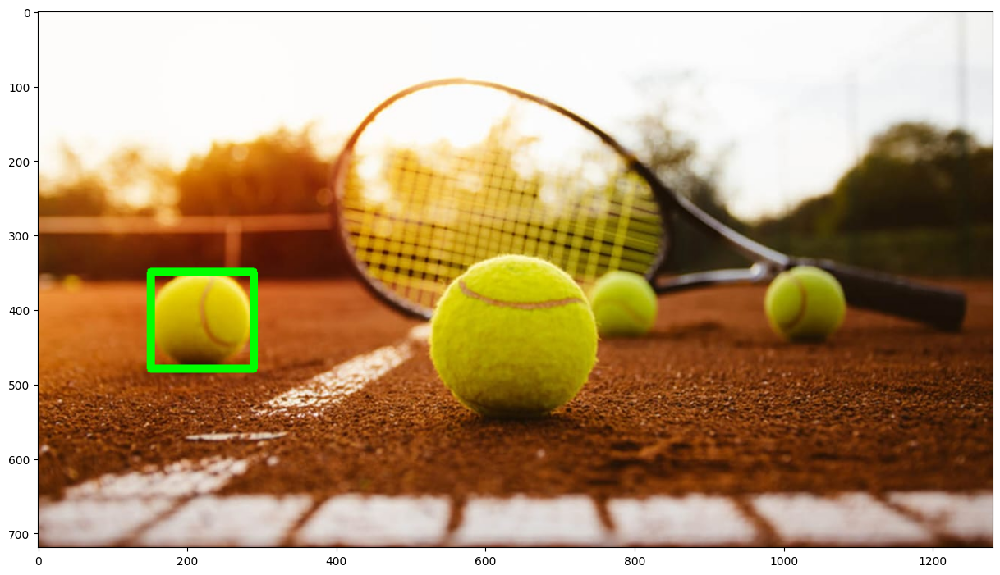

In [ ]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b

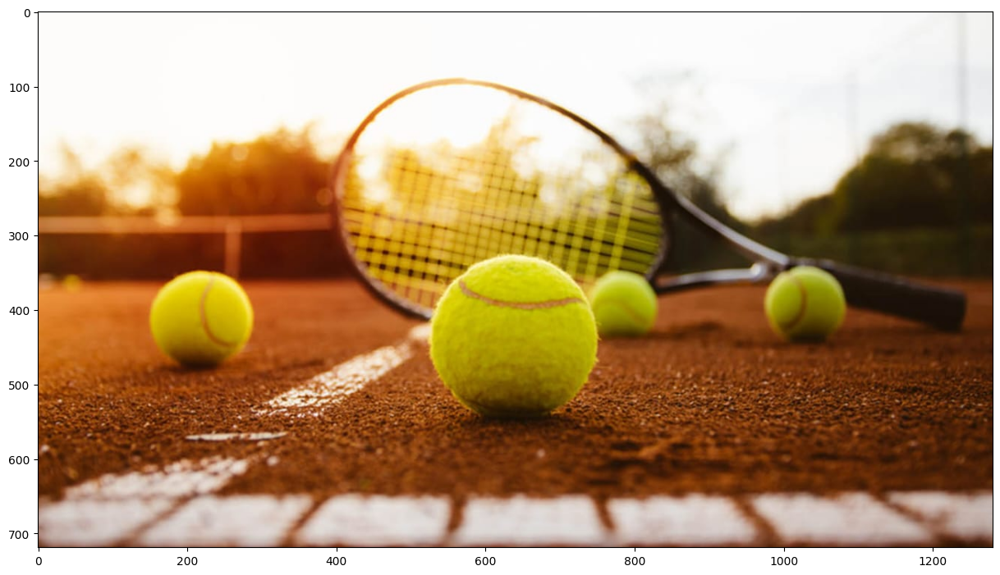

In [ ]:
img_path='/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.13.25_15aefd67.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()


Label: sports ball
Box coordinates: 151, 349, 289, 479
Probability: 0.9995231628417969

Label: sports ball
Box coordinates: 525, 326, 752, 552
Probability: 0.9991335272789001

Label: sports ball
Box coordinates: 739, 351, 832, 439
Probability: 0.9989206790924072

Label: sports ball
Box coordinates: 975, 343, 1084, 445
Probability: 0.997104823589325


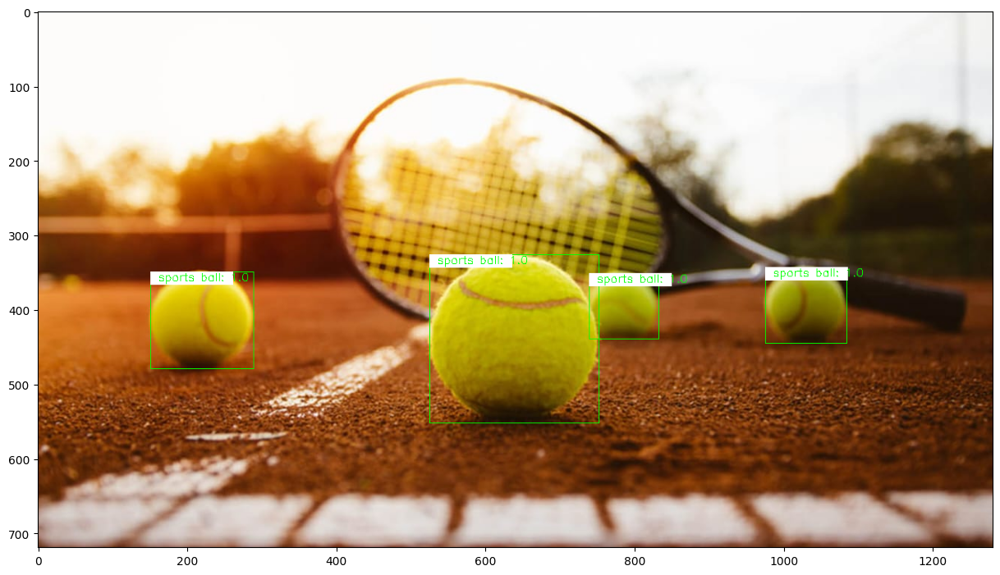

In [ ]:
pred_obj=get_predictions(pred,objects="sports ball")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="52_jpg.rf.ef899df25692cda31b564e263380f9d5")

del pred_obj

##ANOTHER EXPL

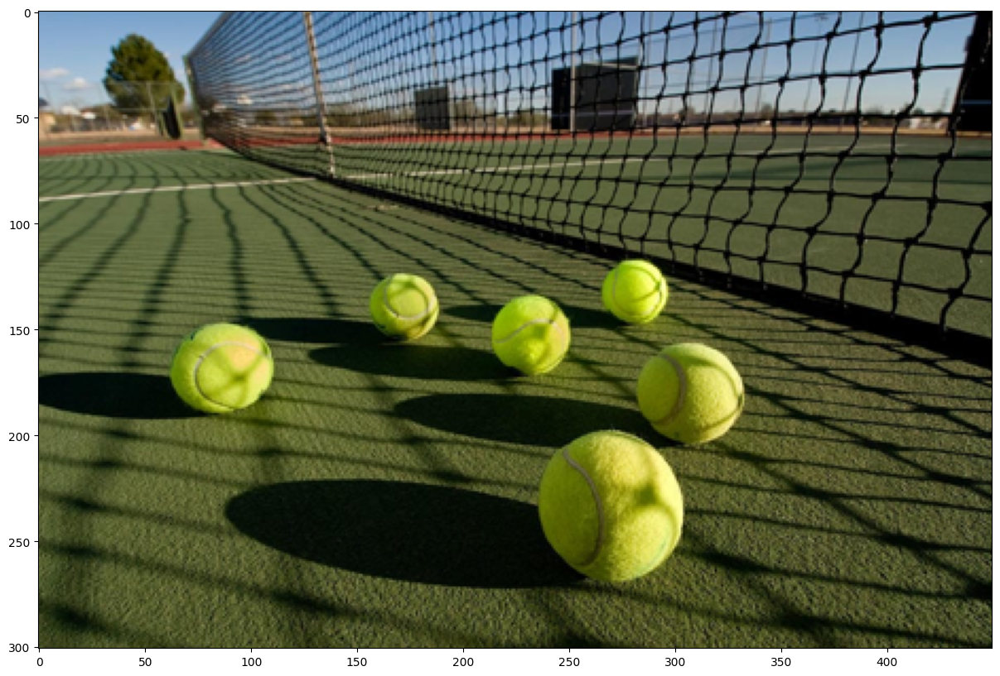

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img_path = '/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.19.31_022aefec.jpg'
half = 0.5

image = Image.open(img_path)
resized_image = image.resize([int(half * s) for s in image.size])  # Resize the image and assign it to resized_image

plt.figure(figsize=(15, 10))
plt.imshow(resized_image)  # Display the resized image
plt.show()


In [ ]:
transform = transforms.Compose([transforms.ToTensor()])
img = transform(image)
img

tensor([[[0.4706, 0.4706, 0.4706,  ..., 0.0000, 0.0000, 0.0000],
         [0.4706, 0.4706, 0.4706,  ..., 0.0000, 0.0000, 0.0000],
         [0.4824, 0.4824, 0.4824,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1059, 0.2196, 0.3412,  ..., 0.0471, 0.0902, 0.1176],
         [0.1922, 0.3059, 0.3059,  ..., 0.0235, 0.0431, 0.0549],
         [0.1961, 0.3059, 0.3059,  ..., 0.0235, 0.0431, 0.0549]],

        [[0.6353, 0.6353, 0.6353,  ..., 0.0000, 0.0000, 0.0000],
         [0.6353, 0.6353, 0.6353,  ..., 0.0000, 0.0000, 0.0000],
         [0.6353, 0.6353, 0.6353,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1490, 0.2627, 0.3725,  ..., 0.0941, 0.1373, 0.1647],
         [0.2353, 0.3490, 0.3373,  ..., 0.0667, 0.0863, 0.0980],
         [0.2392, 0.3490, 0.3373,  ..., 0.0667, 0.0863, 0.0980]],

        [[0.7843, 0.7843, 0.7843,  ..., 0.0000, 0.0000, 0.0000],
         [0.7843, 0.7843, 0.7843,  ..., 0.0000, 0.0000, 0.0000],
         [0.7882, 0.7882, 0.7882,  ..., 0.0000, 0.0000, 0.

In [ ]:
pred = model([img])

In [ ]:
# Assuming pred is your model's prediction output
tennis_ball_label = COCO_INSTANCE_CATEGORY_NAMES.index('sports ball')  # Get the index of 'sports ball' in COCO_INSTANCE_CATEGORY_NAMES

# Filter predictions for tennis balls only
tennis_ball_predictions = [{'boxes': box, 'labels': label, 'scores': score} for box, label, score in zip(pred[0]['boxes'], pred[0]['labels'], pred[0]['scores']) if label == tennis_ball_label]

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_predictions))

# Display tennis ball predictions (if needed)
print("Tennis ball predictions:", tennis_ball_predictions)


Number of tennis ball predictions: 6
Tennis ball predictions: [{'boxes': tensor([532.3750, 234.4716, 593.7593, 296.8559]), 'labels': tensor(37), 'scores': tensor(0.9996)}, {'boxes': tensor([313.2811, 246.7126, 378.4203, 311.1319]), 'labels': tensor(37), 'scores': tensor(0.9991)}, {'boxes': tensor([124.9382, 295.0763, 221.5599, 380.4041]), 'labels': tensor(37), 'scores': tensor(0.9962)}, {'boxes': tensor([564.0029, 313.2762, 667.8058, 414.0728]), 'labels': tensor(37), 'scores': tensor(0.9952)}, {'boxes': tensor([470.0085, 397.1945, 611.2147, 544.9508]), 'labels': tensor(37), 'scores': tensor(0.9876)}, {'boxes': tensor([427.7858, 268.2340, 501.1586, 344.5736]), 'labels': tensor(37), 'scores': tensor(0.9412)}]


In [ ]:
# Assuming pred contains your model's prediction output

# Find the index corresponding to 'sports ball' (tennis ball)
tennis_ball_index = COCO_INSTANCE_CATEGORY_NAMES.index('sports ball')

# Initialize variables to store tennis ball predictions
tennis_ball_labels = []
tennis_ball_scores = []
tennis_ball_boxes = []

# Iterate through each prediction and filter out tennis ball predictions
for label, score, box in zip(pred[0]['labels'], pred[0]['scores'], pred[0]['boxes']):
    if label.item() == tennis_ball_index:  # Check if the label corresponds to tennis ball
        tennis_ball_labels.append(label.item())  # Add the label to the tennis ball labels list
        tennis_ball_scores.append(score.item())  # Add the score to the tennis ball scores list
        tennis_ball_boxes.append(box.tolist())  # Add the bounding box to the tennis ball boxes list

# Print the number of tennis ball predictions
print("Number of tennis ball predictions:", len(tennis_ball_labels))

# Print tennis ball predictions (if needed)
print("Tennis ball labels:", tennis_ball_labels)
print("Tennis ball scores:", tennis_ball_scores)
print("Tennis ball boxes:", tennis_ball_boxes)

# If you want information about the first tennis ball prediction:
if len(tennis_ball_labels) > 0:
    t, l, r, b = [round(x) for x in tennis_ball_boxes[0]]
    print("Bounding box coordinates for the first tennis ball prediction:", t, l, r, b)


Number of tennis ball predictions: 6
Tennis ball labels: [37, 37, 37, 37, 37, 37]
Tennis ball scores: [0.9995521903038025, 0.9990749359130859, 0.9962369203567505, 0.9952253103256226, 0.9875624179840088, 0.9411986470222473]
Tennis ball boxes: [[532.375, 234.47164916992188, 593.7593383789062, 296.85589599609375], [313.2810974121094, 246.7126007080078, 378.4202880859375, 311.13189697265625], [124.93815612792969, 295.0763244628906, 221.55990600585938, 380.4041442871094], [564.0028686523438, 313.2762451171875, 667.8058471679688, 414.0728454589844], [470.00848388671875, 397.19451904296875, 611.2147216796875, 544.9508056640625], [427.7857971191406, 268.2339782714844, 501.1585693359375, 344.5736389160156]]
Bounding box coordinates for the first tennis ball prediction: 532 234 594 297


In [ ]:
img_plot=(np.clip(cv2.cvtColor(np.clip(img.numpy().transpose((1, 2, 0)), 0, 1), cv2.COLOR_RGB2BGR), 0, 1) * 255).astype(np.uint8)
cv2.rectangle(img_plot, (t, l), (r, b), (0, 255, 0), 10) # Draw Rectangle with the coordinates
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_plot, cv2.COLOR_BGR2RGB))
plt.show()
del img_plot, t, l, r, b

In [ ]:
img_path='/content/drive/MyDrive/Colab Notebooks/dataset/test/WhatsApp Image 2024-06-21 at 18.19.31_022aefec.jpg'
image = Image.open(img_path)
image.resize([int(half * s) for s in image.size])
plt.figure(figsize=(15, 10))
plt.imshow(np.array(image))
plt.show()

In [ ]:
pred_obj=get_predictions(pred,objects="sports ball")
draw_box(pred_obj, img, rect_th=1,text_size= 0.5, text_th=1, download_image=True, img_name="52_jpg.rf.ef899df25692cda31b564e263380f9d5")

del pred_obj